# Proyecto 2 - GANs

- **Título:** Añadir o quitar neblina a imágenes satelitales con CycleGANs
- **Materia:**
  - **Nombre:** Aprendizaje profundo
  - **Código:** ESI2498O
- **Profesor:** Iván Reyes Amezcua
- **Fecha de entrega:** 11 de abril de 2024
- **Alumna:**
  - **Nombre:** Judith Alejandra Hinojosa Rábago
  - **Expediente:** 737456
- **Repositorio del proyecto:**

## Generador

In [ ]:
import torch
import torch.nn as nn


class ConvolutionalBlock(nn.Module):
    def __init__(
        self,
        in_channels: int,
        out_channels: int,
        is_downsampling: bool = True,
        add_activation: bool = True,
        **kwargs
    ):
        super().__init__()
        if is_downsampling:
            self.conv = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, padding_mode="reflect", **kwargs),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True) if add_activation else nn.Identity(),
            )
        else:
            self.conv = nn.Sequential(
                nn.ConvTranspose2d(in_channels, out_channels, **kwargs),
                nn.InstanceNorm2d(out_channels),
                nn.ReLU(inplace=True) if add_activation else nn.Identity(),
            )

    def forward(self, x):
        return self.conv(x)


In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, channels: int):
        """
        In a residual block, the use of two ConvBlock instances with one having
        an activation function and the other not is a design choice that promotes
        the learning of residual information.

        The purpose of a residual block is to learn the residual mapping between
        the input and output of the block. The first ConvBlock in the sequence,
        which includes an activation function, helps in capturing and extracting
        important features from the input. The activation function introduces
        non-linearity, allowing the network to model complex relationships
        between the input and output.

        The second ConvBlock does not include an activation function.
        It mainly focuses on adjusting the dimensions (e.g., number of channels)
        of the features extracted by the first ConvBlock. The absence of an
        activation function in the second ConvBlock allows the block to learn
        the residual information. By directly adding the output of the second
        ConvBlock to the original input, the block learns to capture the
        residual features or changes needed to reach the desired output.

        (Information and explanation above generated by ChatGPT)
        """
        super().__init__()
        self.block = nn.Sequential(
            ConvolutionalBlock(channels, channels, add_activation=True, kernel_size=3, padding=1),
            ConvolutionalBlock(channels, channels, add_activation=False, kernel_size=3, padding=1),
        )

    def forward(self, x):
        """
        This skip connection, achieved through the addition operation, helps
        in propagating gradients during training and alleviates the vanishing
        gradient problem. It also facilitates the flow of information from earlier
        layers to later layers, allowing the network to learn more effectively.

        (Information and explanation above generated by ChatGPT)
        """
        return x + self.block(x)


In [ ]:
class Generator(nn.Module):
    def __init__(
        self, img_channels: int, num_features: int = 64, num_residuals: int = 9
    ):
        """
        Generator consists of 2 layers of downsampling/encoding layer,
        followed by 9 residual blocks for 128 × 128 training images
        and then 3 upsampling/decoding layer.

        The network with 6 residual blocks can be written as:
        c7s1–64, d128, d256, R256, R256, R256, R256, R256, R256, u128, u64, and c7s1–3.

        The network with 9 residual blocks consists of:
        c7s1–64, d128, d256, R256, R256, R256, R256, R256, R256, R256, R256, R256, u128, u64, and c7s1–3.
        """
        super().__init__()
        self.initial_layer = nn.Sequential(
            nn.Conv2d(
                img_channels,
                num_features,
                kernel_size=7,
                stride=1,
                padding=3,
                padding_mode="reflect",
            ),
            nn.ReLU(inplace=True),
        )

        self.downsampling_layers = nn.ModuleList(
            [
                ConvolutionalBlock(
                    num_features,
                    num_features * 2,
                    is_downsampling=True,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                ),
                ConvolutionalBlock(
                    num_features * 2,
                    num_features * 4,
                    is_downsampling=True,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                ),
            ]
        )

        self.residual_layers = nn.Sequential(
            *[ResidualBlock(num_features * 4) for _ in range(num_residuals)]
        )

        self.upsampling_layers = nn.ModuleList(
            [
                ConvolutionalBlock(
                    num_features * 4,
                    num_features * 2,
                    is_downsampling=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
                ConvolutionalBlock(
                    num_features * 2,
                    num_features * 1,
                    is_downsampling=False,
                    kernel_size=3,
                    stride=2,
                    padding=1,
                    output_padding=1,
                ),
            ]
        )

        self.last_layer = nn.Conv2d(
            num_features * 1,
            img_channels,
            kernel_size=7,
            stride=1,
            padding=3,
            padding_mode="reflect",
        )

    def forward(self, x):
        x = self.initial_layer(x)
        for layer in self.downsampling_layers:
            x = layer(x)
        x = self.residual_layers(x)
        for layer in self.upsampling_layers:
            x = layer(x)
        return torch.tanh(self.last_layer(x))


## Discriminador

In [ ]:
class ConvInstanceNormLeakyReLUBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, stride: int):
        """
        Class object initialization for Convolution-InstanceNorm-LeakyReLU layer

        We use leaky ReLUs with a slope of 0.2.
        """
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size=4,
                stride=stride,
                padding=1,
                bias=True,
                padding_mode="reflect",
            ),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, x):
        return self.conv(x)


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 128, 256, 512]):
        """
        Let Ck denote a 4 × 4 Convolution-InstanceNorm-LeakyReLU layer with
        k filters and stride 2. Discriminator architecture is: C64-C128-C256-C512.

        After the last layer, we apply a convolution to produce a 1-dimensional
        output.

        We use leaky ReLUs with a slope of 0.2.
        """
        super().__init__()
        self.initial_layer = nn.Sequential(
            nn.Conv2d(
                in_channels,
                features[0],
                kernel_size=4,
                stride=2,
                padding=1,
                padding_mode="reflect",
            ),
            nn.LeakyReLU(0.2, inplace=True),
        )

        layers = []
        in_channels = features[0]
        for feature in features[1:]:
            layers.append(
                ConvInstanceNormLeakyReLUBlock(
                    in_channels,
                    feature,
                    stride=1 if feature == features[-1] else 2,
                )
            )
            in_channels = feature

        # After the last layer, we apply a convolution to produce a 1-dimensional output
        layers.append(
            nn.Conv2d(
                in_channels,
                1,
                kernel_size=4,
                stride=1,
                padding=1,
                padding_mode="reflect",
            )
        )
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = self.initial_layer(x)

        # feed the model output into a sigmoid function to make a 1/0 label
        return torch.sigmoid(self.model(x))

## Importar dataset

In [ ]:
from PIL import Image
import os
from torch.utils.data import Dataset
import numpy as np

class HazedDehazedDataset(Dataset):
    def __init__(self, root_dehazed, root_hazed, transform=None, random=False):
        self.root_dehazed = root_dehazed
        self.root_hazed = root_hazed
        self.transform = transform

        self.dehazed_images = os.listdir(root_dehazed)
        self.hazed_images = os.listdir(root_hazed)

        if random:
          np.random.shuffle(self.dehazed_images)
          np.random.shuffle(self.hazed_images)

        self.length_dataset = max(len(self.dehazed_images), len(self.hazed_images))
        self.dehazed_len = len(self.dehazed_images)
        self.hazed_len = len(self.hazed_images)

    def __len__(self):
        return self.length_dataset

    def __getitem__(self, index):
        dehazed_img = self.dehazed_images[index % self.dehazed_len]
        hazed_img = self.hazed_images[index % self.hazed_len]

        dehazed_path = os.path.join(self.root_dehazed, dehazed_img)
        hazed_path = os.path.join(self.root_hazed, hazed_img)

        dehazed_img = np.array(Image.open(dehazed_path).convert("RGB"))
        hazed_img = np.array(Image.open(hazed_path).convert("RGB"))

        if self.transform:
            augmentations = self.transform(image=dehazed_img, image0=hazed_img)
            dehazed_img = augmentations["image"]
            hazed_img = augmentations["image0"]

        return dehazed_img, hazed_img


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/Haze1k.zip"

In [ ]:
import shutil

# Source path
source = "/content/content/Haze1k"

# Destination path
destination = "/content"

# Move the content of source to destination
dest = shutil.move(source, destination)

# remove "content" directory
os.rmdir("/content/content")

In [ ]:
def get_img_dir(split_type='train', haze='moderate'):
  return f"/content/Haze1k/Haze1k_{haze}/dataset/{split_type}"

In [ ]:
m_train_dir = get_img_dir(split_type='train', haze='moderate')
m_test_dir = get_img_dir(split_type='test', haze='moderate')
m_val_dir = get_img_dir(split_type='val', haze='moderate')

tn_train_dir = get_img_dir(split_type='train', haze='thin')
tn_test_dir = get_img_dir(split_type='test', haze='thin')
tn_val_dir = get_img_dir(split_type='valid', haze='thin')

tk_train_dir = get_img_dir(split_type='train', haze='thick')
tk_test_dir = get_img_dir(split_type='test', haze='thick')
tk_val_dir = get_img_dir(split_type='valid', haze='thick')

## Definir constantes

In [ ]:
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"using device: {DEVICE}")

TRAIN_DIR = "/content/Haze1k/Haze1k_moderate/dataset/train"
VAL_DIR = "/content/Haze1k/Haze1k_moderate/dataset/val"
BATCH_SIZE = 1
LEARNING_RATE = 1e-5
LAMBDA_IDENTITY = 0.0 # loss weight for identity loss
LAMBDA_CYCLE = 10
NUM_WORKERS = 4
NUM_EPOCHS = 50
LOAD_MODEL = True
SAVE_MODEL = True
CHECKPOINT_GENERATOR_H = "/content/drive/MyDrive/models/genh.pth.tar"
CHECKPOINT_GENERATOR_D = "/content/drive/MyDrive/models/genz.pth.tar"
CHECKPOINT_DISCRIMINATOR_H = "/content/drive/MyDrive/models/disch.pth.tar"
CHECKPOINT_DISCRIMINATOR_D = "/content/drive/MyDrive/models/discz.pth.tar"

transforms = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.RandomCrop(width=256, height=256),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
        ToTensorV2(),
    ],
    additional_targets={"image0": "image"},
)

using device: cuda


## Funciones para checkpoints

In [ ]:
import random, torch, os, numpy as np
import torch.nn as nn
import copy

def save_checkpoint(model, optimizer, filename="/content/drive/MyDrive/models/checkpoint.pth.tar"):
    print("=> Saving checkpoint")
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)


def load_checkpoint(checkpoint_file, model, optimizer, lr):
    print("=> Loading checkpoint")
    checkpoint = torch.load(checkpoint_file, map_location=DEVICE)
    model.load_state_dict(checkpoint["state_dict"])
    optimizer.load_state_dict(checkpoint["optimizer"])

    for param_group in optimizer.param_groups:
        param_group["lr"] = lr


def seed_everything(seed=42):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

## Entrenamiento del modelo

In [ ]:
import torch
import sys
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm
from torchvision.utils import save_image

def train_fn(
    disc_H, disc_D, gen_D, gen_H, loader, opt_disc, opt_gen, l1, mse, d_scaler, g_scaler
):
    H_reals = 0
    H_fakes = 0
    loop = tqdm(loader, leave=True)

    for idx, (dehazed, hazed) in enumerate(loop):
        dehazed = dehazed.to(DEVICE)
        hazed = hazed.to(DEVICE)

        # Train discriminators H and Z
        with torch.cuda.amp.autocast():
            fake_hazed = gen_H(dehazed)
            D_H_real = disc_H(hazed)
            D_H_fake = disc_H(fake_hazed.detach())
            H_reals += D_H_real.mean().item()
            H_fakes += D_H_fake.mean().item()
            D_H_real_loss = mse(D_H_real, torch.ones_like(D_H_real))
            D_H_fake_loss = mse(D_H_fake, torch.zeros_like(D_H_fake))
            D_H_loss = D_H_real_loss + D_H_fake_loss

            fake_dehazed = gen_D(hazed)
            D_D_real = disc_D(dehazed)
            D_D_fake = disc_D(fake_dehazed.detach())
            D_D_real_loss = mse(D_D_real, torch.ones_like(D_D_real))
            D_D_fake_loss = mse(D_D_fake, torch.zeros_like(D_D_fake))
            D_D_loss = D_D_real_loss + D_D_fake_loss

            D_loss = (D_H_loss + D_D_loss) / 2

        opt_disc.zero_grad()
        d_scaler.scale(D_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        # Train generators H and D
        with torch.cuda.amp.autocast():
            # adversarial losses
            D_H_fake = disc_H(fake_hazed)
            D_D_fake = disc_D(fake_dehazed)
            loss_G_H = mse(D_H_fake, torch.ones_like(D_H_fake))
            loss_G_D = mse(D_D_fake, torch.ones_like(D_D_fake))

            # cycle losses
            cycle_dehazed = gen_D(fake_hazed)
            cycle_hazed = gen_H(fake_dehazed)
            cycle_dehazed_loss = l1(dehazed, cycle_dehazed)
            cycle_hazed_loss = l1(hazed, cycle_hazed)

            # total loss
            G_loss = (
                loss_G_D
                + loss_G_H
                + cycle_dehazed_loss * LAMBDA_CYCLE
                + cycle_hazed_loss * LAMBDA_CYCLE
            )

        opt_gen.zero_grad()
        g_scaler.scale(G_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 100 == 0:
            save_image(fake_hazed * 0.5 + 0.5, f"/content/drive/MyDrive/outputs/hazed_{idx}.png")
            save_image(fake_dehazed * 0.5 + 0.5, f"/content/drive/MyDrive/outputs/dehazed_{idx}.png")

        loop.set_postfix(H_real=H_reals / (idx + 1), H_fake=H_fakes / (idx + 1))


In [ ]:
def main():
    disc_H = Discriminator(in_channels=3).to(DEVICE)
    disc_D = Discriminator(in_channels=3).to(DEVICE)
    gen_D = Generator(img_channels=3, num_residuals=9).to(DEVICE)
    gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)

    # use Adam Optimizer for both generator and discriminator
    opt_disc = optim.Adam(
        list(disc_H.parameters()) + list(disc_D.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    opt_gen = optim.Adam(
        list(gen_D.parameters()) + list(gen_H.parameters()),
        lr=LEARNING_RATE,
        betas=(0.5, 0.999),
    )

    L1 = nn.L1Loss()
    mse = nn.MSELoss()

    if LOAD_MODEL:
        load_checkpoint(
            CHECKPOINT_GENERATOR_H,
            gen_H,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_GENERATOR_D,
            gen_D,
            opt_gen,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_DISCRIMINATOR_H,
            disc_H,
            opt_disc,
            LEARNING_RATE,
        )
        load_checkpoint(
            CHECKPOINT_DISCRIMINATOR_D,
            disc_D,
            opt_disc,
            LEARNING_RATE,
        )

    train_moderate = HazedDehazedDataset(
        root_hazed=m_train_dir + "/input",
        root_dehazed=m_train_dir + "/target",
        transform=transforms,
        random=True
    )
    train_thin = HazedDehazedDataset(
        root_hazed=tn_train_dir + "/input",
        root_dehazed=tn_train_dir + "/target",
        transform=transforms,
        random=True
    )
    train_thick = HazedDehazedDataset(
        root_hazed=tk_train_dir + "/input",
        root_dehazed=tk_train_dir + "/target",
        transform=transforms,
        random=True
    )
    val_moderate = HazedDehazedDataset(
        root_hazed=m_val_dir + "/input",
        root_dehazed=m_val_dir + "/target",
        transform=transforms,
    )
    val_thin = HazedDehazedDataset(
        root_hazed=tn_val_dir + "/input",
        root_dehazed=tn_val_dir + "/target",
        transform=transforms,
    )
    val_thick = HazedDehazedDataset(
        root_hazed=tk_val_dir + "/input",
        root_dehazed=tk_val_dir + "/target",
        transform=transforms,
    )
    dataset = torch.utils.data.ConcatDataset([train_moderate, train_thin, train_thick])
    val_dataset = torch.utils.data.ConcatDataset([val_moderate, val_thin, val_thick])
    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        pin_memory=True,
    )
    loader = DataLoader(
        dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=NUM_WORKERS,
        pin_memory=True,
    )
    g_scaler = torch.cuda.amp.GradScaler()
    d_scaler = torch.cuda.amp.GradScaler()

    for epoch in range(NUM_EPOCHS):
        train_fn(
            disc_H,
            disc_D,
            gen_D,
            gen_H,
            loader,
            opt_disc,
            opt_gen,
            L1,
            mse,
            d_scaler,
            g_scaler,
        )

        if SAVE_MODEL:
            save_checkpoint(gen_H, opt_gen, filename=CHECKPOINT_GENERATOR_H)
            save_checkpoint(gen_D, opt_gen, filename=CHECKPOINT_GENERATOR_D)
            save_checkpoint(disc_H, opt_disc, filename=CHECKPOINT_DISCRIMINATOR_H)
            save_checkpoint(disc_D, opt_disc, filename=CHECKPOINT_DISCRIMINATOR_D)


main()

=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint
=> Loading checkpoint


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
  0%|          | 0/958 [00:00<?, ?it/s]/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 958/958 [03:58<00:00,  4.02it/s, H_fake=0.443, H_real=0.554]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:51<00:00,  4.13it/s, H_fake=0.445, H_real=0.553]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:52<00:00,  4.12it/s, H_fake=0.441, H_real=0.555]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.10it/s, H_fake=0.444, H_real=0.554]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:52<00:00,  4.12it/s, H_fake=0.442, H_real=0.553]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:52<00:00,  4.12it/s, H_fake=0.442, H_real=0.553]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:52<00:00,  4.12it/s, H_fake=0.441, H_real=0.555]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.11it/s, H_fake=0.44, H_real=0.557]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.10it/s, H_fake=0.442, H_real=0.555]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.10it/s, H_fake=0.441, H_real=0.553]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.11it/s, H_fake=0.441, H_real=0.556]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.11it/s, H_fake=0.441, H_real=0.555]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.11it/s, H_fake=0.443, H_real=0.553]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.11it/s, H_fake=0.441, H_real=0.555]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


100%|██████████| 958/958 [03:53<00:00,  4.10it/s, H_fake=0.44, H_real=0.558]


=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint
=> Saving checkpoint


 64%|██████▍   | 616/958 [02:30<01:21,  4.19it/s, H_fake=0.441, H_real=0.553]

## Prueba

In [ ]:
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader
import torch.optim as optim

In [ ]:
test_moderate = HazedDehazedDataset(
        root_hazed=m_test_dir + "/input",
        root_dehazed=m_test_dir + "/target",
        transform=transforms,
    )
test_thin = HazedDehazedDataset(
        root_hazed=tn_test_dir + "/input",
        root_dehazed=tn_test_dir + "/target",
        transform=transforms,
    )
test_thick = HazedDehazedDataset(
        root_hazed=tk_test_dir + "/input",
        root_dehazed=tk_test_dir + "/target",
        transform=transforms,
    )

In [ ]:
test_moderate_loader = DataLoader(
        test_moderate,
        batch_size=10,
        shuffle=False,
        pin_memory=True,
    )
test_thin_loader = DataLoader(
        test_thin,
        batch_size=10,
        shuffle=False,
        pin_memory=True,
    )
test_thick_loader = DataLoader(
        test_thick,
        batch_size=10,
        shuffle=False,
        pin_memory=True,
    )

In [ ]:
CHECKPOINT_TEST_PATH = "/content/drive/MyDrive/models/entrenamiento/4"

In [ ]:
gen_D = Generator(img_channels=3, num_residuals=9).to(DEVICE)

opt_gen = optim.Adam(
    list(gen_D.parameters()) + list(gen_D.parameters()),
    lr=LEARNING_RATE,
    betas=(0.5, 0.999),
    )

load_checkpoint(
    CHECKPOINT_TEST_PATH + "/Copia de genz.pth.tar",
    gen_D,
    opt_gen,
    LEARNING_RATE
    )

=> Loading checkpoint


In [ ]:
gen_H = Generator(img_channels=3, num_residuals=9).to(DEVICE)

opt_gen = optim.Adam(
    list(gen_H.parameters()) + list(gen_H.parameters()),
    lr=LEARNING_RATE,
    betas=(0.5, 0.999),
    )

load_checkpoint(
    CHECKPOINT_TEST_PATH + "/Copia de genh.pth.tar",
    gen_H,
    opt_gen,
    LEARNING_RATE
    )

=> Loading checkpoint


In [ ]:
def print_results(data_loader, category):
  # obtain one batch of test images
  targets, inputs = next(iter(data_loader))

  inputs = inputs.to(DEVICE)
  # get sample outputs
  outputs = gen_D(inputs)

  # prep images for display
  targets = targets.numpy() * 0.5 + 0.5
  inputs = inputs.cpu().detach().numpy() * 0.5 + 0.5

  # outputs are resized
  outputs = outputs * 0.5 + 0.5

  # detach when requires_grad
  outputs = outputs.cpu().detach().numpy()

  fig, axes = plt.subplots(nrows=3, ncols=10, figsize=(25,10))

  fig.suptitle(category, fontsize = 50)

  # input images on top row, reconstructions on bottom
  for images, row in zip([inputs, targets, outputs], axes):
    for img, ax in zip(images, row):
      ax.imshow(img.T)
      ax.get_xaxis().set_visible(False)
      plt.setp(ax.get_yticklabels(), visible=False)
      ax.tick_params(axis='both', which='both', length=0)

  for i, label in zip(range(axes.shape[0]), ('Input', 'Target', 'Model')):
    axes[i][0].set(ylabel=label)

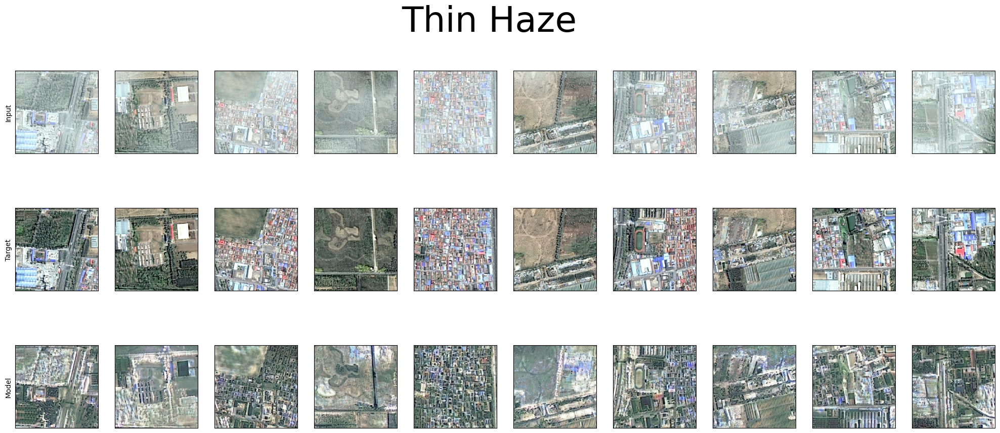

In [ ]:
print_results(test_thin_loader, 'Thin Haze')

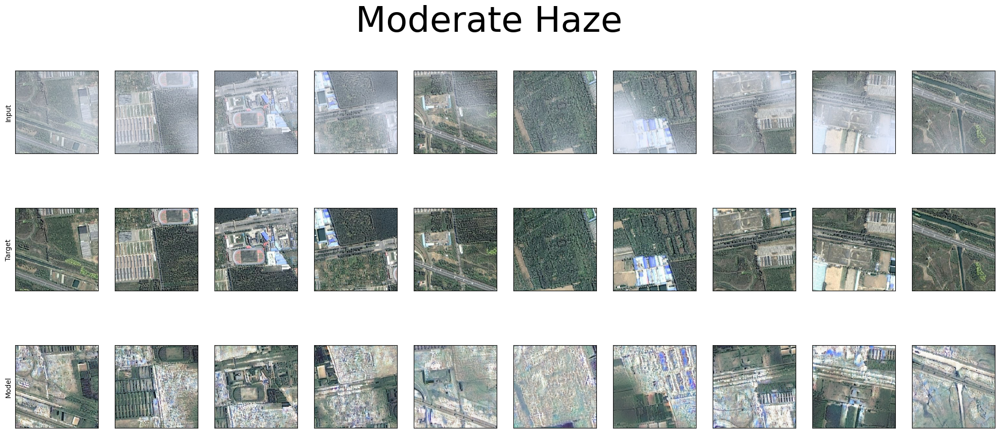

In [ ]:
print_results(test_moderate_loader, 'Moderate Haze')

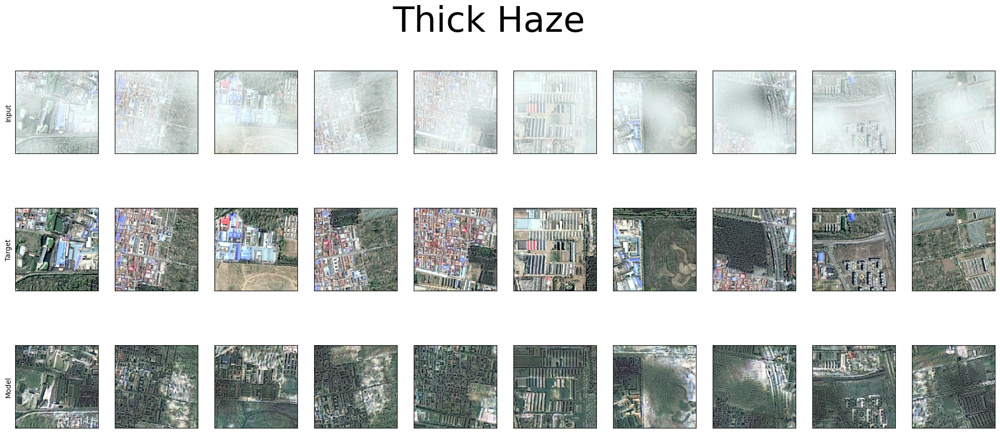

In [ ]:
print_results(test_thick_loader, 'Thick Haze')

In [ ]:
def print_results_inverse(data_loader, category):
  # obtain one batch of test images
  inputs, targets = next(iter(data_loader))

  inputs = inputs.to(DEVICE)
  # get sample outputs
  outputs = gen_H(inputs)

  # prep images for display
  targets = targets.numpy() * 0.5 + 0.5
  inputs = inputs.cpu().detach().numpy() * 0.5 + 0.5

  # outputs are resized
  outputs = outputs * 0.5 + 0.5

  # detach when requires_grad
  outputs = outputs.cpu().detach().numpy()

  fig, axes = plt.subplots(nrows=3, ncols=10, figsize=(25,10))

  fig.suptitle(category, fontsize = 50)

  # input images on top row, reconstructions on bottom
  for images, row in zip([inputs, targets, outputs], axes):
    for img, ax in zip(images, row):
      ax.imshow(img.T)
      ax.get_xaxis().set_visible(False)
      plt.setp(ax.get_yticklabels(), visible=False)
      ax.tick_params(axis='both', which='both', length=0)

  for i, label in zip(range(axes.shape[0]), ('Input', 'Target', 'Model')):
    axes[i][0].set(ylabel=label)

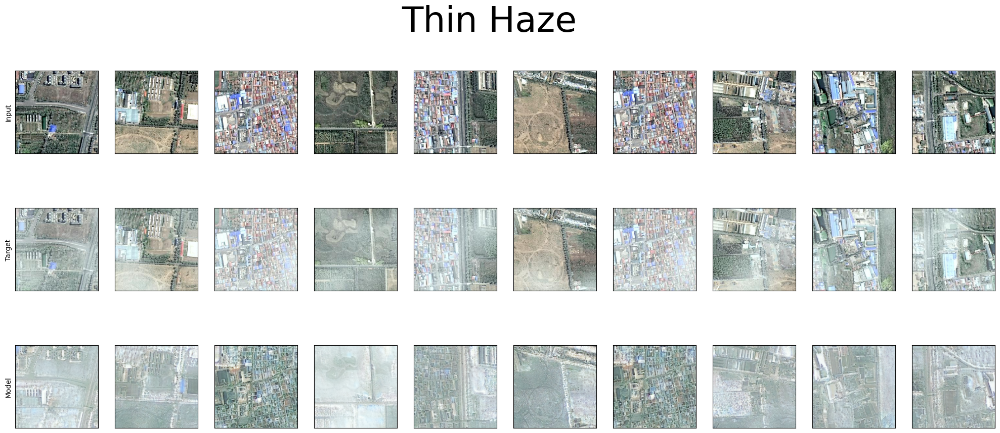

In [ ]:
print_results_inverse(test_thin_loader, 'Thin Haze')

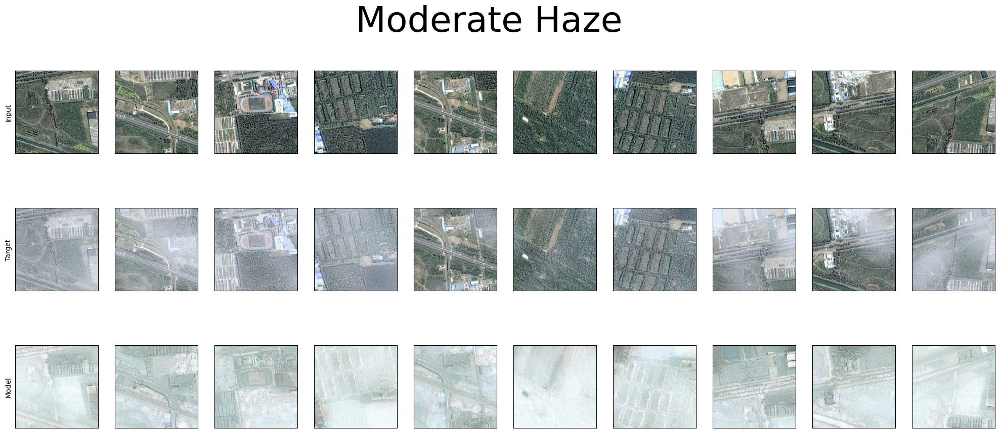

In [ ]:
print_results_inverse(test_moderate_loader, 'Moderate Haze')

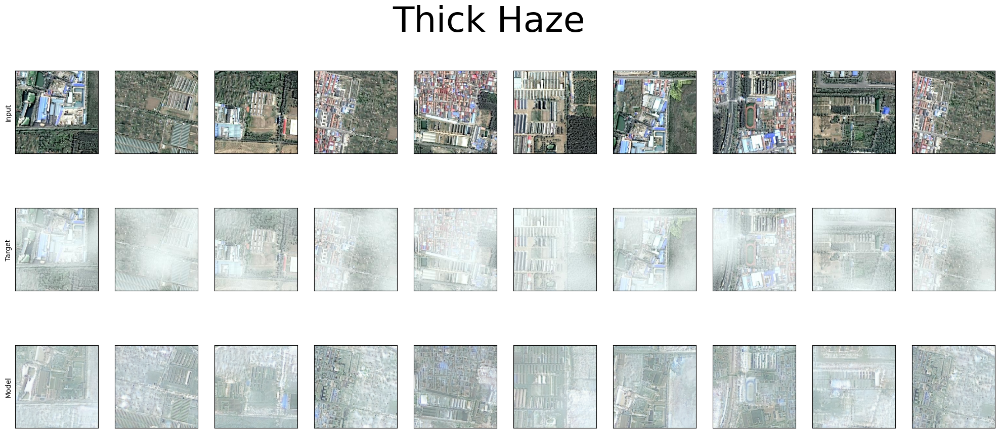

In [ ]:
print_results_inverse(test_thick_loader, 'Thick Haze')